In [1]:
#### importing original data ####
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np 
import seaborn as sns 
import re 
%matplotlib inline
import glob
from tqdm import tqdm
import statsmodels.api as sm
import scipy.stats as stats
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

In [2]:
# load example neighbor data 
df = pd.read_csv('/scratch/gh8sj/brown_nsclc/data/processed_data/dfs_3_years_labeled_with_neighbors.csv', index_col = 0)
list(df.columns);

/tmp/ipykernel_295027/2530953133.py:2: DtypeWarning: Columns (164,167,172,173,177,178,187,191,196,197,198,199,200) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('/scratch/gh8sj/brown_nsclc/data/processed_data/dfs_3_years_labeled_with_neighbors.csv', index_col = 0)


In [3]:
# create new variables: total number of neighbors defined as the total number of neighbors of each immune cell subset based on the sum of IFN+ and IFN- or the total number of cancer cell neighbors MHC+ and MHC-
# first tumor then stroma at 30 and 200 um
df['CD3+CD8-IFNy+ total Neighbors_30um'] = df['CD3+CD8-IFNy+ Tumor Neighbors_30um'] +df['CD3+CD8-IFNy+ Stroma Neighbors_30um']

df['Total CD3+CD8+ Tumor Neighbors_30um'] = df['CD3+CD8+IFNy+ Tumor Neighbors_30um'] + df['CD3+CD8+IFNy- Tumor Neighbors_30um']
df['Total CD3+CD8- Tumor Neighbors_30um'] = df['CD3+CD8-IFNy+ Tumor Neighbors_30um'] + df['CD3+CD8-IFNy- Tumor Neighbors_30um']
df['Total CD56+CD3- Tumor Neighbors_30um'] = df['CD56+CD3-IFNy+ Tumor Neighbors_30um'] + df['CD56+CD3-IFNy- Tumor Neighbors_30um']
df['Total PanCyto Tumor Neighbors_30um'] = df['PanCyto+MHCI+ Tumor Neighbors_30um'] + df['PanCyto+MHCI- Tumor Neighbors_30um']

df['Total CD3+CD8+ Stroma Neighbors_30um'] = df['CD3+CD8+IFNy+ Stroma Neighbors_30um'] + df['CD3+CD8+IFNy- Stroma Neighbors_30um']
df['Total CD3+CD8- Stroma Neighbors_30um'] = df['CD3+CD8-IFNy+ Stroma Neighbors_30um'] + df['CD3+CD8-IFNy- Stroma Neighbors_30um']
df['Total CD56+CD3- Stroma Neighbors_30um'] = df['CD56+CD3-IFNy+ Stroma Neighbors_30um'] + df['CD56+CD3-IFNy- Stroma Neighbors_30um']
df['Total PanCyto Stroma Neighbors_30um'] = df['PanCyto+MHCI+ Stroma Neighbors_30um'] + df['PanCyto+MHCI- Stroma Neighbors_30um']

df['Total CD3+CD8+ Tumor Neighbors_200um'] = df['CD3+CD8+IFNy+ Tumor Neighbors_30um'] + df['CD3+CD8+IFNy- Tumor Neighbors_30um']
df['Total CD3+CD8- Tumor Neighbors_200um'] = df['CD3+CD8-IFNy+ Tumor Neighbors_30um'] + df['CD3+CD8-IFNy- Tumor Neighbors_30um']
df['Total CD56+CD3- Tumor Neighbors_200um'] = df['CD56+CD3-IFNy+ Tumor Neighbors_30um'] + df['CD56+CD3-IFNy- Tumor Neighbors_30um']
df['Total PanCyto Tumor Neighbors_200um'] = df['PanCyto+MHCI+ Tumor Neighbors_200um'] + df['PanCyto+MHCI- Tumor Neighbors_200um']

df['Total CD3+CD8+ Stroma Neighbors_200um'] = df['CD3+CD8+IFNy+ Stroma Neighbors_200um'] + df['CD3+CD8+IFNy- Stroma Neighbors_200um']
df['Total CD3+CD8- Stroma Neighbors_200um'] = df['CD3+CD8-IFNy+ Stroma Neighbors_200um'] + df['CD3+CD8-IFNy- Stroma Neighbors_200um']
df['Total CD56+CD3- Stroma Neighbors_200um'] = df['CD56+CD3-IFNy+ Stroma Neighbors_200um'] + df['CD56+CD3-IFNy- Stroma Neighbors_200um']
df['Total PanCyto Stroma Neighbors_200um'] = df['PanCyto+MHCI+ Stroma Neighbors_200um'] + df['PanCyto+MHCI- Stroma Neighbors_200um']


In [4]:
# define cell types and neighbors
cell_types = ['PanCyto+MHCI+', 'PanCyto+MHCI-',
       'CD3+CD8+IFNy+', 'CD3+CD8+IFNy-', 'CD3+CD8-IFNy+', 'CD3+CD8-IFNy-',
       'CD56+CD3-IFNy+', 'CD56+CD3-IFNy-']

neighbors = ['CD3+CD8+IFNy+ Tumor Neighbors_30um','CD3+CD8+IFNy+ Stroma Neighbors_30um','CD3+CD8+IFNy- Tumor Neighbors_30um','CD3+CD8+IFNy- Stroma Neighbors_30um',
             'CD3+CD8-IFNy+ Tumor Neighbors_30um','CD3+CD8-IFNy+ Stroma Neighbors_30um','CD3+CD8-IFNy- Tumor Neighbors_30um','CD3+CD8-IFNy- Stroma Neighbors_30um',
             'CD56+CD3-IFNy+ Tumor Neighbors_30um','CD56+CD3-IFNy+ Stroma Neighbors_30um','CD56+CD3-IFNy- Tumor Neighbors_30um','CD56+CD3-IFNy- Stroma Neighbors_30um',
             'PanCyto+MHCI+ Tumor Neighbors_30um','PanCyto+MHCI+ Stroma Neighbors_30um','PanCyto+MHCI- Tumor Neighbors_30um','PanCyto+MHCI- Stroma Neighbors_30um',  
             'CD3+CD8+IFNy+ Tumor Neighbors_200um','CD3+CD8+IFNy+ Stroma Neighbors_200um','CD3+CD8+IFNy- Tumor Neighbors_200um','CD3+CD8+IFNy- Stroma Neighbors_200um',
             'CD3+CD8-IFNy+ Tumor Neighbors_200um','CD3+CD8-IFNy+ Stroma Neighbors_200um','CD3+CD8-IFNy- Tumor Neighbors_200um','CD3+CD8-IFNy- Stroma Neighbors_200um',
             'CD56+CD3-IFNy+ Tumor Neighbors_200um','CD56+CD3-IFNy+ Stroma Neighbors_200um','CD56+CD3-IFNy- Tumor Neighbors_200um','CD56+CD3-IFNy- Stroma Neighbors_200um',
             'PanCyto+MHCI+ Tumor Neighbors_200um','PanCyto+MHCI+ Stroma Neighbors_200um','PanCyto+MHCI- Tumor Neighbors_200um','PanCyto+MHCI- Stroma Neighbors_200um']


In [5]:
# rename the dataframe to have a backup
full_df = df

In [6]:
# grab some images
full_df.ImageLocation.unique()[:10]

array(['E:\\BROWN RESCAN 11.8.19\\Rescan Images 11.11.19\\MAD17-199_[43424,7543]_component_data.tif',
       'E:\\BROWN RESCAN 11.8.19\\Rescan Images 11.11.19\\MAD17-199_[43424,9043]_component_data.tif',
       'E:\\BROWN RESCAN 11.8.19\\Rescan Images 11.11.19\\MAD17-199_[44446,10543]_component_data.tif',
       'E:\\BROWN RESCAN 11.8.19\\Rescan Images 11.11.19\\MAD17-199_[44675,12043]_component_data.tif',
       'E:\\BROWN RESCAN 11.8.19\\Rescan Images 11.11.19\\MAD17-199_[45431,7543]_component_data.tif',
       'E:\\BROWN RESCAN 11.8.19\\Rescan Images 11.11.19\\MAD17-199_[45431,9043]_component_data.tif',
       'E:\\BROWN RESCAN 11.8.19\\Rescan Images 11.11.19\\MAD17-199_[46399,13543]_component_data.tif',
       'E:\\BROWN RESCAN 11.8.19\\Rescan Images 11.11.19\\MAD17-199_[46453,10543]_component_data.tif',
       'E:\\BROWN RESCAN 11.8.19\\Rescan Images 11.11.19\\MAD17-199_[46621,6043]_component_data.tif',
       'E:\\BROWN RESCAN 11.8.19\\Rescan Images 11.11.19\\MAD17-199_[46682,120

In [7]:
# define a color palette 
from pypalettes import load_cmap
from pypalettes import load_cmap
cmap = load_cmap("zigzagoon")
cmap.hex

['#A87858FF',
 '#685848FF',
 '#C0A888FF',
 '#E0D0A8FF',
 '#C89878FF',
 '#484028FF',
 '#100000FF',
 '#403830FF',
 '#E8B898FF',
 '#F8E8C0FF',
 '#785848FF',
 '#C83820FF',
 '#A02000FF',
 '#A09078FF']

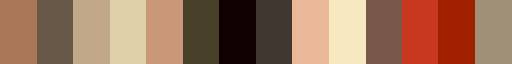

In [8]:
cmap

/tmp/ipykernel_295027/2538130278.py:11: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  ax0 = sns.scatterplot(ax = axes[0,0], data = rep_image, x = 'XCenter', y = 'YCenter', hue= 'PanCyto',  palette = cmap.hex[4:], size='CellArea', sizes=(2.5, 75))


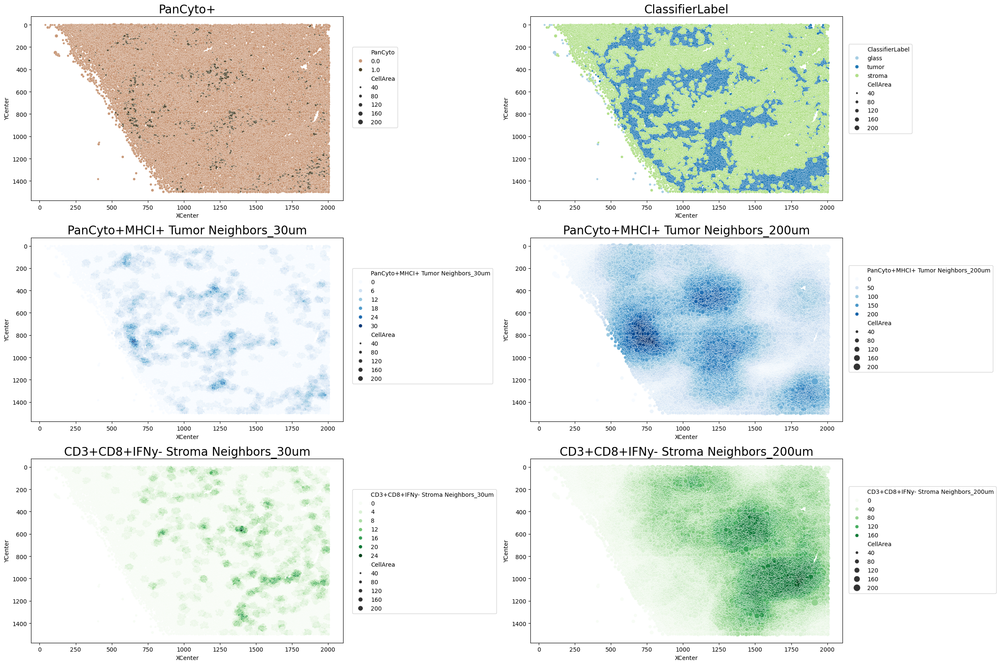

In [9]:
# plot a tissue region for several phenotypes/neighborhood values

rep_image = full_df.loc[full_df['ImageLocation'] == r'E:\BROWN RESCAN 11.8.19\Rescan Images 11.11.19\MAD17-199_[44446,10543]_component_data.tif']

plt.style.use('dark_background')
plt.style.use('default')

fig, axes = plt.subplots(3, 2, figsize=(24,16))
#fig.subplots_adjust(wspace=0.5, hspace = 0.2)

ax0 = sns.scatterplot(ax = axes[0,0], data = rep_image, x = 'XCenter', y = 'YCenter', hue= 'PanCyto',  palette = cmap.hex[4:], size='CellArea', sizes=(2.5, 75))
ax0.set_title('PanCyto+', fontsize = 20)  
ax0.legend(bbox_to_anchor=(1.02, 0.85))
#ax0.get_legend().remove()
#ax0.set_ylim(0, 500)
#ax0.set_xlim(0, 1000)
ax0.invert_yaxis()

custom_palette = sns.color_palette("Paired")[4:] 
ax1 = sns.scatterplot(ax = axes[0,1], data=rep_image, x = 'XCenter', y = 'YCenter', hue= 'ClassifierLabel',  palette ="Paired", size='CellArea', sizes=(2.5,75))
ax1.set_title('ClassifierLabel', fontsize = 20)  
ax1.legend(bbox_to_anchor=(1.02, 0.85), loc='upper left', borderaxespad=0)
#ax1.get_legend().remove()
#ax1.set_ylim(0, 1500)
#ax1.set_xlim(0, 2000)
ax1.invert_yaxis()
##
#custom_palette = sns.color_palette("Paired")[4:] 
ax2 = sns.scatterplot(ax = axes[1,0], data=rep_image, x = 'XCenter', y = 'YCenter', hue= 'PanCyto+MHCI+ Tumor Neighbors_30um' , palette = 'Blues', size='CellArea', sizes=(2.5, 75))
#ax2 = sns.scatterplot(ax = axes[1,0], data = late_stage_df[late_stage_df.ImageLocation == late_test_set[2]], x = 'XCenter', y = 'YCenter', hue= 'CD56+CD3-IFNy- Tumor Neighbors_200um',  palette = 'viridis', size='CellArea', sizes=(2.5, 75),hue_norm = (0,60))
ax2.set_title('PanCyto+MHCI+ Tumor Neighbors_30um', fontsize = 20)  
ax2.legend(bbox_to_anchor=(1.02, 0.85))
#ax0.get_legend().remove()
#ax0.set_ylim(0, 500)
#ax0.set_xlim(0, 1000)
ax2.invert_yaxis()
#
#custom_palette = sns.color_palette("Paired")[6:] 
ax3 = sns.scatterplot(ax = axes[1,1], data=rep_image, x='XCenter', y='YCenter', hue='PanCyto+MHCI+ Tumor Neighbors_200um',palette = 'Blues', size='CellArea', sizes=(5, 150))
#ax3 = sns.scatterplot(ax = axes[1,1], data = early_stage_df[early_stage_df.ImageLocation == early_test_set[2]], x = 'XCenter', y = 'YCenter', hue= 'CD56+CD3-IFNy- Tumor Neighbors_200um', palette = 'viridis_r',  size='CellArea',sizes=(2.5, 75), hue_norm = (0,60))
ax3.set_title('PanCyto+MHCI+ Tumor Neighbors_200um', fontsize = 20)  
ax3.legend(bbox_to_anchor=(1.02, 0.85), loc='upper left', borderaxespad=0)
#ax1.get_legend().remove()
#ax1.set_ylim(0, 1500)
#ax1.set_xlim(0, 2000)
ax3.invert_yaxis()
#

ax4 = sns.scatterplot(ax = axes[2,0], data=rep_image, x = 'XCenter', y = 'YCenter', hue= 'CD3+CD8+IFNy- Stroma Neighbors_30um',  size='CellArea',palette = 'Greens', sizes=(2.5, 75))
#ax2 = sns.scatterplot(ax = axes[2,0], data = late_stage_df[late_stage_df.ImageLocation == late_test_set[2]], x = 'XCenter', y = 'YCenter', hue= 'CD56+CD3-IFNy- Tumor Neighbors_200um',  palette = 'viridis', size='CellArea', sizes=(2.5, 75),hue_norm = (0,60))
ax4.set_title('CD3+CD8+IFNy- Stroma Neighbors_30um', fontsize = 20)  
ax4.legend(bbox_to_anchor=(1.02, 0.85))
#ax0.get_legend().remove()
#ax0.set_ylim(0, 500)
#ax0.set_xlim(0, 1000)
ax4.invert_yaxis()
#
#custom_palette = sns.color_palette("Paired")[6:] 
ax5 = sns.scatterplot(ax = axes[2,1], data=rep_image, x='XCenter', y='YCenter', hue='CD3+CD8+IFNy- Stroma Neighbors_200um',size='CellArea',palette = 'Greens', sizes=(5, 150))
#ax3 = sns.scatterplot(ax = axes[2,1], data = early_stage_df[early_stage_df.ImageLocation == early_test_set[2]], x = 'XCenter', y = 'YCenter', hue= 'CD56+CD3-IFNy- Tumor Neighbors_200um', palette = 'viridis_r',  size='CellArea',sizes=(2.5, 75), hue_norm = (0,60))
ax5.set_title('CD3+CD8+IFNy- Stroma Neighbors_200um', fontsize = 20)  
ax5.legend(bbox_to_anchor=(1.02, 0.85), loc='upper left', borderaxespad=0)
#ax1.get_legend().remove()
#ax1.set_ylim(0, 1500)
#ax1.set_xlim(0, 2000)
ax5.invert_yaxis()
#


plt.tight_layout()
#fig.suptitle('NK cells in in patients with high vs low grade tumors', fontsize=30, y=1.05)
#plt.savefig('/scratch/gh8sj/kate_gabe_paper_figures/figure6/representative_fig.pdf', format = 'pdf')
#plt.savefig('vectra_analysis_results/recreated_images/intensity_stains.png', bbox_inches = 'tight')
#sns.boxplot(data=df, x='team', y='points', ax=axes[0,0])
#sns.boxplot(data=df, x='team', y='assists', ax=axes[0,1])
#sns.boxplot(data=df, x='team', y='rebounds', ax=axes[1,0])
#sns.boxplot(data=df, x='team', y='blocks', ax=axes[1,1])

In [10]:
mad15690_list = [i for i in list(full_df['ImageLocation'].unique()) if '15-690' in i]

In [11]:
full_df.loc[full_df['ImageLocation'] == mad15690_list[4]]

,Slide Index,ImageLocation,XMin,XMax,YMin,YMax,MHCI,CD56,CD8,CD3,...,Total CD56+CD3- Stroma Neighbors_30um,Total PanCyto Stroma Neighbors_30um,Total CD3+CD8+ Tumor Neighbors_200um,Total CD3+CD8- Tumor Neighbors_200um,Total CD56+CD3- Tumor Neighbors_200um,Total PanCyto Tumor Neighbors_200um,Total CD3+CD8+ Stroma Neighbors_200um,Total CD3+CD8- Stroma Neighbors_200um,Total CD56+CD3- Stroma Neighbors_200um,Total PanCyto Stroma Neighbors_200um
1685033,0,E:\Brown 3.21.19\IMAGES 3.25.19\MAD15-690_[479...,2003.46256,2009.39728,392.68064,400.09904,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.0,263.0,5.0,13.0,1.0,21.0
1685034,1,E:\Brown 3.21.19\IMAGES 3.25.19\MAD15-690_[479...,2002.96800,2008.90272,1172.60176,1178.04192,0.0,0.0,0.0,0.0,...,0.0,2.0,0.0,2.0,0.0,255.0,67.0,70.0,0.0,15.0
1685035,2,E:\Brown 3.21.19\IMAGES 3.25.19\MAD15-690_[479...,128.09104,135.01488,656.77568,665.67776,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,411.0,19.0,54.0,0.0,86.0
1685036,3,E:\Brown 3.21.19\IMAGES 3.25.19\MAD15-690_[479...,146.88432,155.29184,659.74304,667.65600,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,421.0,19.0,60.0,0.0,96.0
1685037,4,E:\Brown 3.21.19\IMAGES 3.25.19\MAD15-690_[479...,1934.22416,1941.64256,111.27600,119.68352,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,180.0,6.0,30.0,1.0,11.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1706897,21864,E:\Brown 3.21.19\IMAGES 3.25.19\MAD15-690_[479...,1892.68112,1900.59408,1483.18544,1493.07664,0.0,0.0,1.0,1.0,...,0.0,3.0,3.0,1.0,0.0,251.0,28.0,26.0,0.0,25.0
1706898,21865,E:\Brown 3.21.19\IMAGES 3.25.19\MAD15-690_[479...,1906.03424,1913.45264,1491.09840,1500.49504,0.0,0.0,0.0,0.0,...,0.0,2.0,1.0,0.0,0.0,226.0,27.0,23.0,0.0,24.0
1706899,21866,E:\Brown 3.21.19\IMAGES 3.25.19\MAD15-690_[479...,1609.29824,1616.22208,1492.08752,1502.47328,0.0,0.0,0.0,1.0,...,0.0,0.0,4.0,4.0,0.0,161.0,65.0,99.0,3.0,14.0
1706900,21867,E:\Brown 3.21.19\IMAGES 3.25.19\MAD15-690_[479...,1960.93040,1970.82160,1493.57120,1500.00048,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,4.0,0.0,196.0,17.0,16.0,0.0,20.0


In [12]:
# Count occurrences of CD3+CD8+IFNy+ per ImageLocation
sorted_locations = (full_df[full_df['CD3+CD8+IFNy+'] == 1]  # Adjust this condition as needed
                    .groupby('ImageLocation')
                    .size()
                    .reset_index(name='CD3+CD8+IFNy+ Count')
                    .sort_values(by='CD3+CD8+IFNy+ Count', ascending=False))
sorted_locations

,ImageLocation,CD3+CD8+IFNy+ Count
89,E:\Brown 4.25.19\Unmixed Images 4.29.19\MAD17-...,645
48,E:\Brown 3.21.19\IMAGES 3.25.19\MAD17-205_[464...,458
93,E:\Brown 4.25.19\Unmixed Images 4.29.19\MAD17-...,445
92,E:\Brown 4.25.19\Unmixed Images 4.29.19\MAD17-...,332
96,E:\Brown 4.25.19\Unmixed Images 4.29.19\MAD17-...,272
...,...,...
26,E:\Brown 3.21.19\IMAGES 3.25.19\MAD15-517_[419...,1
133,E:\Brown 4.25.19\Unmixed Images 4.29.19\MAD17-...,1
137,E:\Brown 4.25.19\Unmixed Images 4.29.19\MAD17-...,1
138,E:\Brown 4.25.19\Unmixed Images 4.29.19\MAD17-...,1


/tmp/ipykernel_295027/321907350.py:9: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  ax0 = sns.scatterplot(ax = axes[0,0], data = rep_image, x = 'XCenter', y = 'YCenter', hue= 'CD3+CD8+IFNy+',  palette = cmap.hex[4:], size='CellArea', sizes=(1, 50))


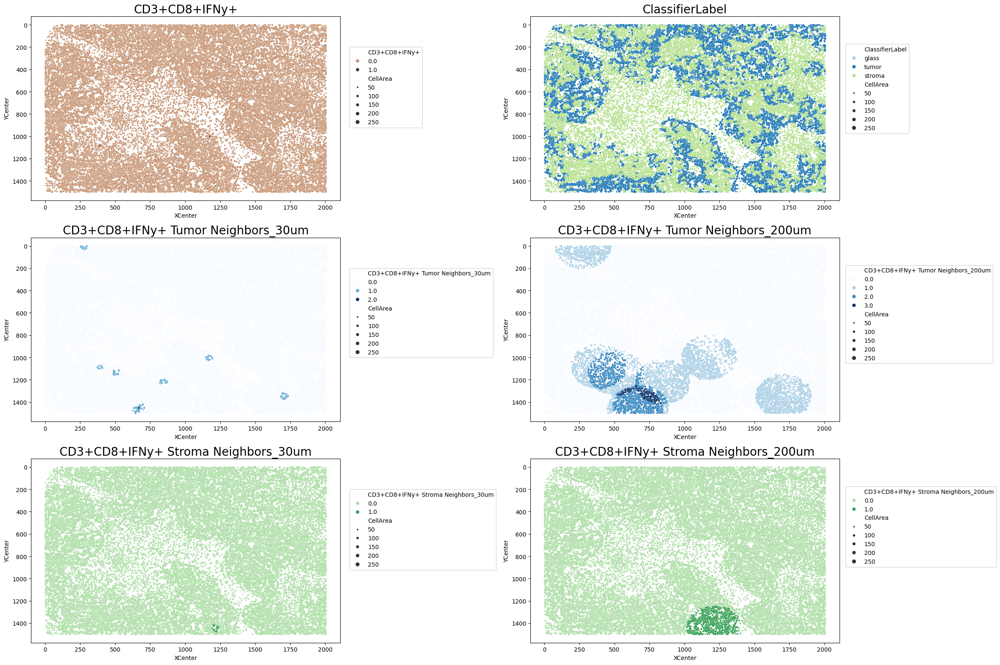

In [13]:
# same as above but for a different region
rep_image = full_df.loc[full_df['ImageLocation'] == mad15690_list[8]]
plt.style.use('dark_background')
plt.style.use('default')

fig, axes = plt.subplots(3, 2, figsize=(24,16))
#fig.subplots_adjust(wspace=0.5, hspace = 0.2)

ax0 = sns.scatterplot(ax = axes[0,0], data = rep_image, x = 'XCenter', y = 'YCenter', hue= 'CD3+CD8+IFNy+',  palette = cmap.hex[4:], size='CellArea', sizes=(1, 50))
ax0.set_title('CD3+CD8+IFNy+', fontsize = 20)  
ax0.legend(bbox_to_anchor=(1.02, 0.85))
#ax0.get_legend().remove()
#ax0.set_ylim(0, 500)
#ax0.set_xlim(0, 1000)
ax0.invert_yaxis()

custom_palette = sns.color_palette("Paired")[4:] 
ax1 = sns.scatterplot(ax = axes[0,1], data=rep_image, x = 'XCenter', y = 'YCenter', hue= 'ClassifierLabel',  palette ="Paired", size='CellArea', sizes=(1, 50))
ax1.set_title('ClassifierLabel', fontsize = 20)  
ax1.legend(bbox_to_anchor=(1.02, 0.85), loc='upper left', borderaxespad=0)
#ax1.get_legend().remove()
#ax1.set_ylim(0, 1500)
#ax1.set_xlim(0, 2000)
ax1.invert_yaxis()
##
#custom_palette = sns.color_palette("Paired")[4:] 
ax2 = sns.scatterplot(ax = axes[1,0], data=rep_image, x = 'XCenter', y = 'YCenter', hue= 'CD3+CD8+IFNy+ Tumor Neighbors_30um' , palette = 'Blues', size='CellArea', sizes=(1, 50))
#ax2 = sns.scatterplot(ax = axes[1,0], data = late_stage_df[late_stage_df.ImageLocation == late_test_set[2]], x = 'XCenter', y = 'YCenter', hue= 'CD56+CD3-IFNy- Tumor Neighbors_200um',  palette = 'viridis', size='CellArea', sizes=(2.5, 75),hue_norm = (0,60))
ax2.set_title('CD3+CD8+IFNy+ Tumor Neighbors_30um', fontsize = 20)  
ax2.legend(bbox_to_anchor=(1.02, 0.85))
#ax0.get_legend().remove()
#ax0.set_ylim(0, 500)
#ax0.set_xlim(0, 1000)
ax2.invert_yaxis()
#
#custom_palette = sns.color_palette("Paired")[6:] 
ax3 = sns.scatterplot(ax = axes[1,1], data=rep_image, x='XCenter', y='YCenter', hue='CD3+CD8+IFNy+ Tumor Neighbors_200um',palette = 'Blues', size='CellArea',sizes=(1, 50))
#ax3 = sns.scatterplot(ax = axes[1,1], data = early_stage_df[early_stage_df.ImageLocation == early_test_set[2]], x = 'XCenter', y = 'YCenter', hue= 'CD56+CD3-IFNy- Tumor Neighbors_200um', palette = 'viridis_r',  size='CellArea',sizes=(2.5, 75), hue_norm = (0,60))
ax3.set_title('CD3+CD8+IFNy+ Tumor Neighbors_200um', fontsize = 20)  
ax3.legend(bbox_to_anchor=(1.02, 0.85), loc='upper left', borderaxespad=0)
#ax1.get_legend().remove()
#ax1.set_ylim(0, 1500)
#ax1.set_xlim(0, 2000)
ax3.invert_yaxis()
#

ax4 = sns.scatterplot(ax = axes[2,0], data=rep_image, x = 'XCenter', y = 'YCenter', hue= 'CD3+CD8+IFNy+ Stroma Neighbors_30um',  size='CellArea',palette = 'Greens', sizes=(1, 50))
#ax2 = sns.scatterplot(ax = axes[2,0], data = late_stage_df[late_stage_df.ImageLocation == late_test_set[2]], x = 'XCenter', y = 'YCenter', hue= 'CD56+CD3-IFNy- Tumor Neighbors_200um',  palette = 'viridis', size='CellArea', sizes=(2.5, 75),hue_norm = (0,60))
ax4.set_title('CD3+CD8+IFNy+ Stroma Neighbors_30um', fontsize = 20)  
ax4.legend(bbox_to_anchor=(1.02, 0.85))
#ax0.get_legend().remove()
#ax0.set_ylim(0, 500)
#ax0.set_xlim(0, 1000)
ax4.invert_yaxis()
#
#custom_palette = sns.color_palette("Paired")[6:] 
ax5 = sns.scatterplot(ax = axes[2,1], data=rep_image, x='XCenter', y='YCenter', hue='CD3+CD8+IFNy+ Stroma Neighbors_200um',size='CellArea',palette = 'Greens', sizes=(1, 50))
#ax3 = sns.scatterplot(ax = axes[2,1], data = early_stage_df[early_stage_df.ImageLocation == early_test_set[2]], x = 'XCenter', y = 'YCenter', hue= 'CD56+CD3-IFNy- Tumor Neighbors_200um', palette = 'viridis_r',  size='CellArea',sizes=(2.5, 75), hue_norm = (0,60))
ax5.set_title('CD3+CD8+IFNy+ Stroma Neighbors_200um', fontsize = 20)  
ax5.legend(bbox_to_anchor=(1.02, 0.85), loc='upper left', borderaxespad=0)
#ax1.get_legend().remove()
#ax1.set_ylim(0, 1500)
#ax1.set_xlim(0, 2000)
ax5.invert_yaxis()
#


plt.tight_layout()
#fig.suptitle('NK cells in in patients with high vs low grade tumors', fontsize=30, y=1.05)
#plt.savefig('/scratch/gh8sj/kate_gabe_paper_figures/figure6/representative_fig.pdf', format = 'pdf')
#plt.savefig('vectra_analysis_results/recreated_images/intensity_stains.png', bbox_inches = 'tight')
#sns.boxplot(data=df, x='team', y='points', ax=axes[0,0])
#sns.boxplot(data=df, x='team', y='assists', ax=axes[0,1])
#sns.boxplot(data=df, x='team', y='rebounds', ax=axes[1,0])
#sns.boxplot(data=df, x='team', y='blocks', ax=axes[1,1])

/tmp/ipykernel_295027/4083501041.py:9: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  ax0 = sns.scatterplot(ax = axes[0,0], data = rep_image, x = 'XCenter', y = 'YCenter', hue= 'CD3+CD8+IFNy+',  palette = cmap.hex[4:], size='CellArea', sizes=(1, 50))


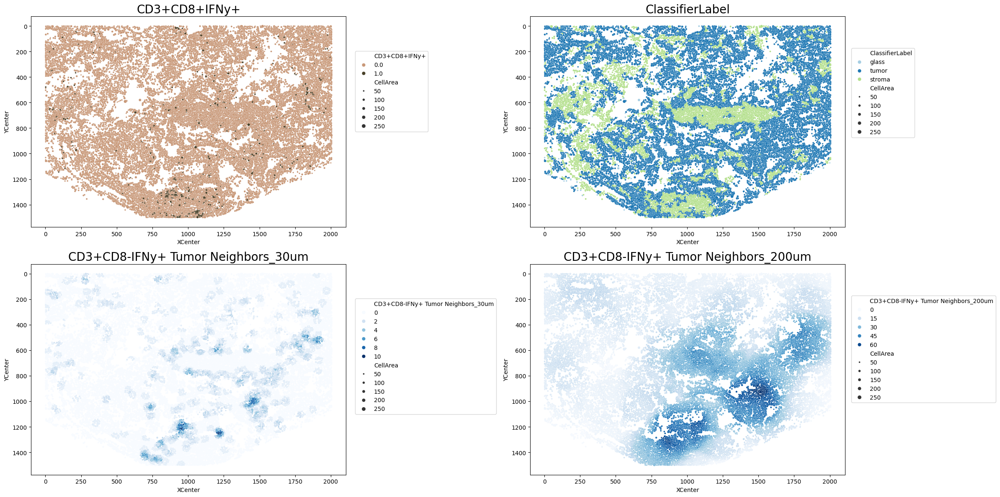

In [17]:
# same as above but for a different region
rep_image = full_df.loc[full_df['ImageLocation'] == sorted_locations.iloc[1,0]]
plt.style.use('dark_background')
plt.style.use('default')

fig, axes = plt.subplots(2, 2, figsize=(24,12))
#fig.subplots_adjust(wspace=0.5, hspace = 0.2)

ax0 = sns.scatterplot(ax = axes[0,0], data = rep_image, x = 'XCenter', y = 'YCenter', hue= 'CD3+CD8+IFNy+',  palette = cmap.hex[4:], size='CellArea', sizes=(1, 50))
ax0.set_title('CD3+CD8+IFNy+', fontsize = 20)  
ax0.legend(bbox_to_anchor=(1.02, 0.85))
#ax0.get_legend().remove()
#ax0.set_ylim(0, 500)
#ax0.set_xlim(0, 1000)
ax0.invert_yaxis()

custom_palette = sns.color_palette("Paired")[4:] 
ax1 = sns.scatterplot(ax = axes[0,1], data=rep_image, x = 'XCenter', y = 'YCenter', hue= 'ClassifierLabel',  palette ="Paired", size='CellArea', sizes=(1, 50))
ax1.set_title('ClassifierLabel', fontsize = 20)  
ax1.legend(bbox_to_anchor=(1.02, 0.85), loc='upper left', borderaxespad=0)
#ax1.get_legend().remove()
#ax1.set_ylim(0, 1500)
#ax1.set_xlim(0, 2000)
ax1.invert_yaxis()
##
#custom_palette = sns.color_palette("Paired")[4:] 
ax2 = sns.scatterplot(ax = axes[1,0], data=rep_image, x = 'XCenter', y = 'YCenter', hue= 'CD3+CD8-IFNy+ Tumor Neighbors_30um' , palette = 'Blues', size='CellArea', sizes=(1, 50))
#ax2 = sns.scatterplot(ax = axes[1,0], data = late_stage_df[late_stage_df.ImageLocation == late_test_set[2]], x = 'XCenter', y = 'YCenter', hue= 'CD56+CD3-IFNy- Tumor Neighbors_200um',  palette = 'viridis', size='CellArea', sizes=(2.5, 75),hue_norm = (0,60))
ax2.set_title('CD3+CD8-IFNy+ Tumor Neighbors_30um', fontsize = 20)  
ax2.legend(bbox_to_anchor=(1.02, 0.85))
#ax0.get_legend().remove()
#ax0.set_ylim(0, 500)
#ax0.set_xlim(0, 1000)
ax2.invert_yaxis()
#
#custom_palette = sns.color_palette("Paired")[6:] 
ax3 = sns.scatterplot(ax = axes[1,1], data=rep_image, x='XCenter', y='YCenter', hue='CD3+CD8-IFNy+ Tumor Neighbors_200um',palette = 'Blues', size='CellArea',sizes=(1, 50))
#ax3 = sns.scatterplot(ax = axes[1,1], data = early_stage_df[early_stage_df.ImageLocation == early_test_set[2]], x = 'XCenter', y = 'YCenter', hue= 'CD56+CD3-IFNy- Tumor Neighbors_200um', palette = 'viridis_r',  size='CellArea',sizes=(2.5, 75), hue_norm = (0,60))
ax3.set_title('CD3+CD8-IFNy+ Tumor Neighbors_200um', fontsize = 20)  
ax3.legend(bbox_to_anchor=(1.02, 0.85), loc='upper left', borderaxespad=0)
#ax1.get_legend().remove()
#ax1.set_ylim(0, 1500)
#ax1.set_xlim(0, 2000)
ax3.invert_yaxis()
#


#


plt.tight_layout()
#fig.suptitle('NK cells in in patients with high vs low grade tumors', fontsize=30, y=1.05)
#plt.savefig('/scratch/gh8sj/kate_gabe_paper_figures/figure6/representative_fig.pdf', format = 'pdf')
#plt.savefig('vectra_analysis_results/recreated_images/intensity_stains.png', bbox_inches = 'tight')
#sns.boxplot(data=df, x='team', y='points', ax=axes[0,0])
#sns.boxplot(data=df, x='team', y='assists', ax=axes[0,1])
#sns.boxplot(data=df, x='team', y='rebounds', ax=axes[1,0])
#sns.boxplot(data=df, x='team', y='blocks', ax=axes[1,1])

/tmp/ipykernel_295027/2041984468.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rep_image['CD3+CD8-IFNy+ total Neighbors_30um'] = rep_image['CD3+CD8-IFNy+ Tumor Neighbors_30um'] +rep_image['CD3+CD8-IFNy+ Stroma Neighbors_30um']
/tmp/ipykernel_295027/2041984468.py:68: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  ax1 = sns.scatterplot(ax = axes[1,0], data=rep_image, x = 'XCenter', y = 'YCenter', hue= 'CD3+CD8+IFNy+',  palette =cmap.hex[4:])


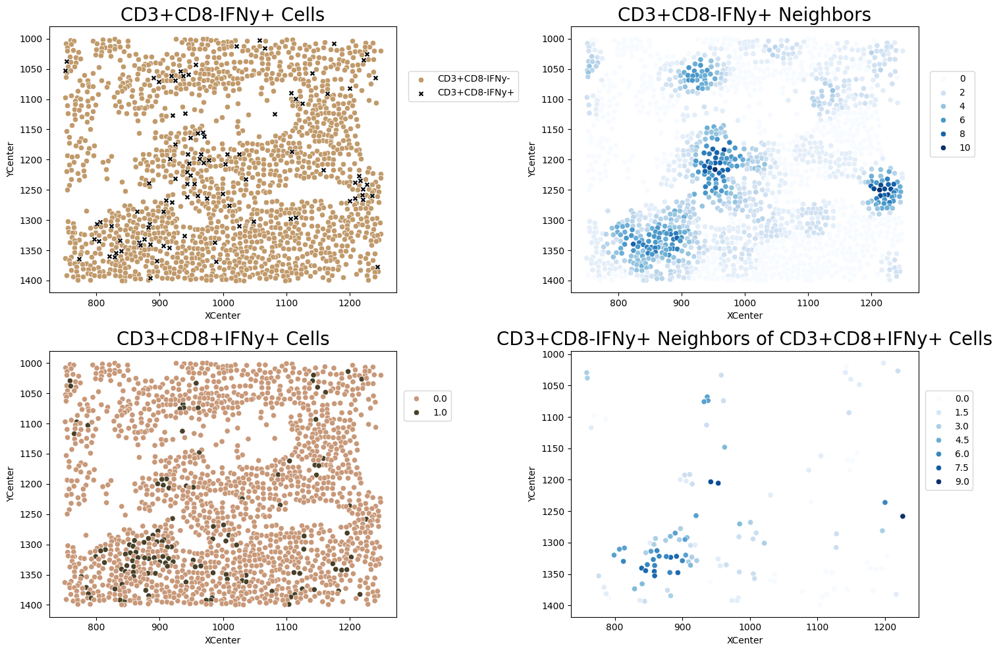

In [18]:
# subset a very small region to illustrate the pehnotypes and neighbhorhood densities

rep_image = full_df.loc[full_df['ImageLocation'] == sorted_locations.iloc[1,0]]
rep_image['CD3+CD8-IFNy+ total Neighbors_30um'] = rep_image['CD3+CD8-IFNy+ Tumor Neighbors_30um'] +rep_image['CD3+CD8-IFNy+ Stroma Neighbors_30um']

rep_image = rep_image.loc[
    (rep_image['XCenter'] > 750) &  (rep_image['XCenter'] < 1250) &
    (rep_image['YCenter'] > 1000) & (rep_image['YCenter'] < 1400)
]
rep_image_cent = rep_image.loc[rep_image['CD3+CD8+IFNy+'] == 1.0,:]
plt.style.use('dark_background')
plt.style.use('default')

fig, axes = plt.subplots(2, 2, figsize=(15,10))
#fig.subplots_adjust(wspace=0.5, hspace = 0.2)

# Define subsets
pos_cells = rep_image[rep_image['CD3+CD8-IFNy+'] == 1.0]
neg_cells = rep_image[rep_image['CD3+CD8-IFNy+'] == 0.0]

# Plot negatives as light brown circles
sns.scatterplot(
    ax=axes[0,0],
    data=neg_cells,
    x='XCenter',
    y='YCenter',
    color='#c19a6b',  # light brown
    marker='o',
    label='CD3+CD8-IFNy-'
)

# Plot positives as black X
sns.scatterplot(
    ax=axes[0,0],
    data=pos_cells,
    x='XCenter',
    y='YCenter',
    color='black',
    marker='X',
    label='CD3+CD8-IFNy+'
)

# Set title, legend, axis
ax0 = axes[0,0]
ax0.set_title('CD3+CD8-IFNy+ Cells', fontsize=20)
ax0.legend(bbox_to_anchor=(1.02, 0.85))
#ax0.invert_yaxis()
ax0.set_title('CD3+CD8-IFNy+ Cells', fontsize = 20)  
ax0.legend(bbox_to_anchor=(1.02, 0.85))
#ax0.get_legend().remove()
#ax0.set_ylim(0, 500)
#ax0.set_xlim(0, 1000)
ax0.invert_yaxis()

##
#custom_palette = sns.color_palette("Paired")[4:] 
ax2 = sns.scatterplot(ax = axes[0,1], data=rep_image, x = 'XCenter', y = 'YCenter', hue= 'CD3+CD8-IFNy+ total Neighbors_30um' , palette = 'Blues')
#ax2 = sns.scatterplot(ax = axes[1,0], data = late_stage_df[late_stage_df.ImageLocation == late_test_set[2]], x = 'XCenter', y = 'YCenter', hue= 'CD56+CD3-IFNy- Tumor Neighbors_200um',  palette = 'viridis', size='CellArea', sizes=(2.5, 75),hue_norm = (0,60))
ax2.set_title('CD3+CD8-IFNy+ Neighbors', fontsize = 20)  
ax2.legend(bbox_to_anchor=(1.02, 0.85))
#ax0.get_legend().remove()
#ax0.set_ylim(0, 500)
#ax0.set_xlim(0, 1000)
ax2.invert_yaxis()
#

custom_palette = sns.color_palette("Paired")[4:] 
ax1 = sns.scatterplot(ax = axes[1,0], data=rep_image, x = 'XCenter', y = 'YCenter', hue= 'CD3+CD8+IFNy+',  palette =cmap.hex[4:])
ax1.set_title('CD3+CD8+IFNy+ Cells', fontsize = 20)  
ax1.legend(bbox_to_anchor=(1.02, 0.85), loc='upper left', borderaxespad=0)
#ax1.get_legend().remove()
#ax1.set_ylim(0, 1500)
#ax1.set_xlim(0, 2000)
ax1.invert_yaxis()

#custom_palette = sns.color_palette("Paired")[6:] 
ax3 = sns.scatterplot(ax = axes[1,1], data=rep_image_cent, x='XCenter', y='YCenter', hue='CD3+CD8-IFNy+ total Neighbors_30um',palette = 'Blues')
#ax3 = sns.scatterplot(ax = axes[1,1], data = early_stage_df[early_stage_df.ImageLocation == early_test_set[2]], x = 'XCenter', y = 'YCenter', hue= 'CD56+CD3-IFNy- Tumor Neighbors_200um', palette = 'viridis_r',  size='CellArea',sizes=(2.5, 75), hue_norm = (0,60))
ax3.set_title('CD3+CD8-IFNy+ Neighbors of CD3+CD8+IFNy+ Cells', fontsize = 20)  
ax3.legend(bbox_to_anchor=(1.02, 0.85), loc='upper left', borderaxespad=0)
#ax1.get_legend().remove()
#ax1.set_ylim(0, 1500)
#ax1.set_xlim(0, 2000)
ax3.invert_yaxis()
#

#custom_palette = sns.color_palette("Paired")[2:] 
#ax4 = sns.scatterplot(ax = axes[2,0], data=rep_image, x = 'XCenter', y = 'YCenter', hue= 'ClassifierLabel', palette =custom_palette)
##ax2 = sns.scatterplot(ax = axes[2,0], data = late_stage_df[late_stage_df.ImageLocation == late_test_set[2]], x = 'XCenter', y = 'YCenter', hue= 'CD56+CD3-IFNy- Tumor Neighbors_200um',  palette = 'viridis', size='CellArea', sizes=(2.5, 75),hue_norm = (0,60))
#ax4.set_title('Tumor vs Stroma', fontsize = 20)  
#ax4.legend(bbox_to_anchor=(1.02, 0.85))
##ax0.get_legend().remove()
##ax0.set_ylim(0, 500)
##ax0.set_xlim(0, 1000)
#ax4.invert_yaxis()
##
##custom_palette = sns.color_palette("Paired")[6:] 
#ax5 = sns.scatterplot(ax = axes[2,1], data=rep_image, x='XCenter', y='YCenter', hue='CD3+CD8-IFNy+ Stroma Neighbors_30um',palette = 'Greens')
##ax3 = sns.scatterplot(ax = axes[2,1], data = early_stage_df[early_stage_df.ImageLocation == early_test_set[2]], x = 'XCenter', y = 'YCenter', hue= 'CD56+CD3-IFNy- Tumor Neighbors_200um', palette = 'viridis_r',  size='CellArea',sizes=(2.5, 75), hue_norm = (0,60))
#ax5.set_title('CD3+CD8-IFNy+ Stroma Neighbors_200um', fontsize = 20)  
#ax5.legend(bbox_to_anchor=(1.02, 0.85), loc='upper left', borderaxespad=0)
##ax1.get_legend().remove()
##ax1.set_ylim(0, 1500)
##ax1.set_xlim(0, 2000)
#ax5.invert_yaxis()
#


plt.tight_layout()
#fig.suptitle('NK cells in in patients with high vs low grade tumors', fontsize=30, y=1.05)
plt.savefig('/scratch/gh8sj/kate_gabe_paper_figures/figure0/representative_fig.pdf', format = 'pdf')
#plt.savefig('vectra_analysis_results/recreated_images/intensity_stains.png', bbox_inches = 'tight')
#sns.boxplot(data=df, x='team', y='points', ax=axes[0,0])
#sns.boxplot(data=df, x='team', y='assists', ax=axes[0,1])
#sns.boxplot(data=df, x='team', y='rebounds', ax=axes[1,0])
#sns.boxplot(data=df, x='team', y='blocks', ax=axes[1,1])

In [21]:
# number of CD3+CD8-IFNg+ cells in this image
rep_image['CD3+CD8-IFNy+'].value_counts()

CD3+CD8-IFNy+
0.0    1591
1.0      98
Name: count, dtype: int64

In [22]:
# number of CD3+CD8+IFNg+ cells in this image
rep_image['CD3+CD8+IFNy+'].value_counts()

CD3+CD8+IFNy+
0.0    1567
1.0     122
Name: count, dtype: int64

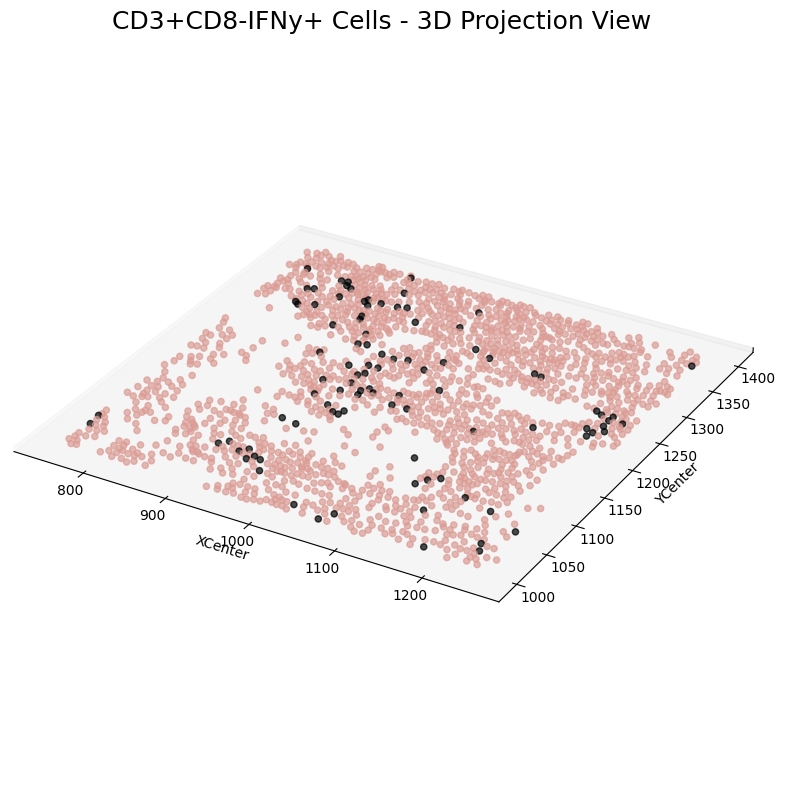

In [25]:
# 3D view of CD8- counts
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 8), facecolor='white')
ax = fig.add_subplot(111, projection='3d', facecolor='white')

# Map hue to color
colors = rep_image['CD3+CD8-IFNy+'].map({0.0: '#DB9C94', 1.0: 'black'})

# 3D scatter plot
ax.scatter(
    rep_image['XCenter'],
    rep_image['YCenter'],
    zs=0,
    zdir='z',
    c=colors,
    marker='o',
    s=20,
    alpha=0.7
)

# View angle
ax.view_init(elev=30, azim=-60)

# Labels
ax.set_title('CD3+CD8-IFNy+ Cells - 3D Projection View', fontsize=18)
ax.set_xlabel('XCenter')
ax.set_ylabel('YCenter')
ax.set_zlabel('Projection')

# Aesthetic tweaks
ax.grid(False)
ax.set_zticks([])
ax.set_box_aspect([1, 1, 0.01])  # Flatten Z to emphasize plane

plt.tight_layout()
plt.show()


/tmp/ipykernel_295027/1252073140.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('Blues')


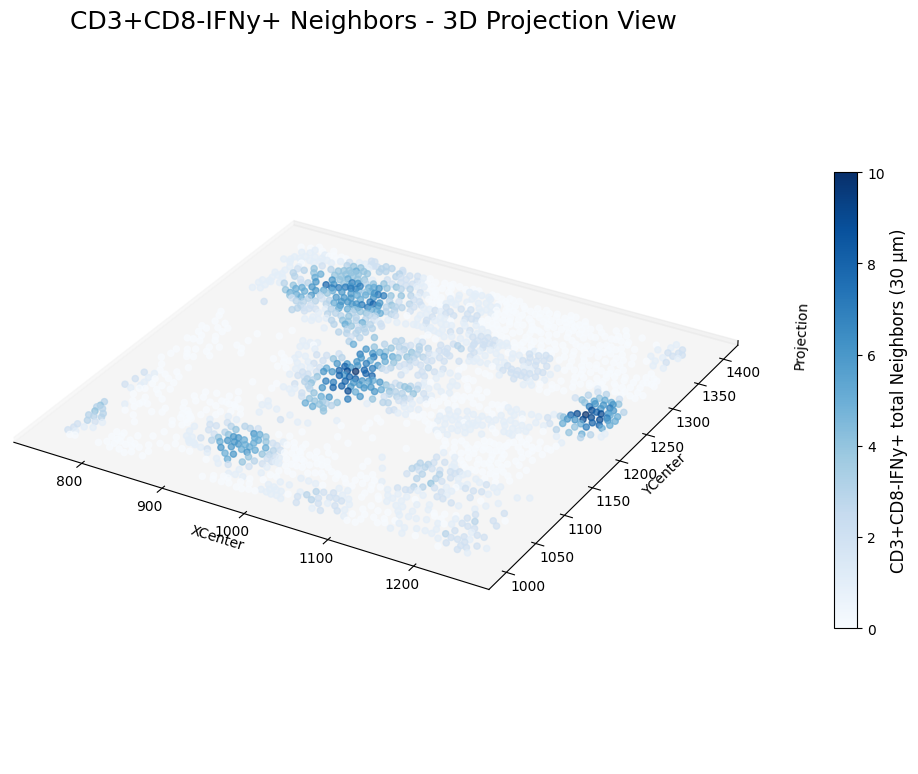

In [26]:
# 3D view of transformed neighborhood density for Cd8- cells 
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.cm as cm
import matplotlib.colors as mcolors

fig = plt.figure(figsize=(10, 8), facecolor='white')
ax = fig.add_subplot(111, projection='3d', facecolor='white')

# Normalize and colormap
values = rep_image['CD3+CD8-IFNy+ total Neighbors_30um']
norm = mcolors.Normalize(vmin=values.min(), vmax=values.max())
cmap = cm.get_cmap('Blues')
colors = cmap(norm(values))

# 3D scatter plot
sc = ax.scatter(
    rep_image['XCenter'],
    rep_image['YCenter'],
    zs=0,
    zdir='z',
    c=colors,
    marker='o',
    s=20,
    alpha=0.7
)

# Add colorbar with explicit axis
mappable = cm.ScalarMappable(norm=norm, cmap=cmap)
mappable.set_array([])
cbar = fig.colorbar(mappable, ax=ax, shrink=0.6, pad=0.1)
cbar.set_label('CD3+CD8-IFNy+ total Neighbors (30 µm)', fontsize=12)

# View settings
ax.view_init(elev=30, azim=-60)
ax.set_title('CD3+CD8-IFNy+ Neighbors - 3D Projection View', fontsize=18)
ax.set_xlabel('XCenter')
ax.set_ylabel('YCenter')
ax.set_zlabel('Projection')
ax.grid(False)
ax.set_zticks([])
ax.set_box_aspect([1, 1, 0.01])

plt.tight_layout()

plt.show()
